#### The following script reproduces the original model of grid cells proposed by:

Guanella, Alexis, Daniel Kiper, and Paul Verschure. "A model of grid cells based on a twisted torus topology." International journal of neural systems 17, no. 04 (2007): 231-240.

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal
import scipy.ndimage.filters as filt
import math

Build a virtual spatial navigation trajectory

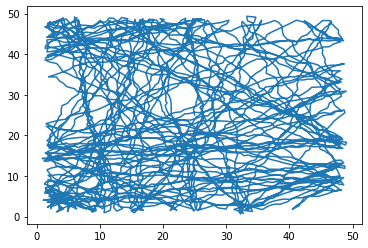

In [2]:
arena_size = 50

arenaX = [0,arena_size]
arenaY = [0,arena_size]

## Initial position
Txx = [arenaX[1]/2]
Tyy = [arenaY[1]/2]

def conv(ang):
    x = np.cos(np.radians(ang)) 
    y = np.sin(np.radians(ang)) 
    return x , y

def random_navigation(length):
    thetaList = []

    theta = 90
    counter = 0
    lenght_counter = 0
    for i in range(length):
        lenght_counter += 1

        prevTheta = np.copy(theta)

        if( Txx[-1]<2 ): theta = np.random.randint(-85,85)

        if( Txx[-1]>arena_size-2 ): theta = np.random.randint(95,260)

        if( Tyy[-1]<2 ): theta = np.random.randint(10,170)

        if( Tyy[-1]>arena_size-2 ): theta = np.random.randint(190,350)


        Txx.append( Txx[-1]+conv(theta)[0] + np.random.uniform(-0.5,0.5) )
        Tyy.append( Tyy[-1]+conv(theta)[1] + np.random.uniform(-0.5,0.5)  )

        cx = abs( Txx[-1] - Txx[-2]  )
        cy = abs( Tyy[-1] - Tyy[-2]  )
        h = np.sqrt( cx**2 + cy**2  )
        counter+=h

        if(theta != prevTheta or i == length-1):
            thetaList.append( [prevTheta, conv(prevTheta)[0], conv(prevTheta)[1], counter]  )
            counter = 0
    
    plt.plot(Txx,Tyy, '-')
    plt.show()

Time = 5000
random_navigation(Time)

Txx = np.array(Txx)
Tyy = np.array(Tyy)

Grid class implementing the actual computational model of grid cells

In [15]:
class Grid():
    def __init__(self):
        
        self.mm = 10 #20 grid size, small->large, clean, take long time
        self.nn = 10 #20
        self.TAO = 0.9 #0.9
        self.II = 0.3 #0.3, large->stripe
        self.SIGMA = 0.24 #0.24
        self.SIGMA2 = self.SIGMA**2 #**2
        self.TT = 0.05 #0.05
        self.grid_gain = [0.07]#[0.04,0.05,0.06,0.07,0.08]
        self.grid_layers = len(self.grid_gain)  
        self.grid_activity = np.random.uniform(0,1,(self.mm,self.nn,self.grid_layers)) 
        self.grid_activity2 = np.random.uniform(0,1,(self.mm,self.nn,self.grid_layers)) 
        self.grid_activity3 = np.random.uniform(0,1,(self.mm,self.nn,self.grid_layers)) 
        self.distTri = self.buildTopology(self.mm,self.nn)


    def update(self, speedVector):

        self.speedVector = speedVector
        
        grid_ActTemp = []
        for jj in range(0,self.grid_layers):
            rrr = self.grid_gain[jj]*np.exp(1j*0)
            matWeights = self.updateWeight(self.distTri,rrr)
            activityVect = np.ravel(self.grid_activity[:,:,jj])
            activityVect = self.Bfunc(activityVect, matWeights)
            activityTemp = activityVect.reshape(self.mm,self.nn)
            activityTemp += self.TAO *( activityTemp/np.mean(activityTemp) - activityTemp)
            activityTemp[activityTemp<0] = 0

            self.grid_activity[:,:,jj] = (activityTemp-np.min(activityTemp))/(np.max(activityTemp)-np.min(activityTemp)) * 30  ##Eq 2
            
    def update2(self, speedVector):

        self.speedVector = speedVector
        
        grid_ActTemp = []
        for jj in range(0,self.grid_layers):
            rrr = self.grid_gain[jj]*np.exp(1j*0)
            matWeights2 = self.updateWeight(self.distTri,rrr)
            activityVect2 = np.ravel(self.grid_activity2[:,:,jj])
            activityVect2 = self.Bfunc(activityVect2, matWeights2)
            activityTemp2 = activityVect2.reshape(self.mm,self.nn)
            activityTemp2 += self.TAO *(activityTemp2/np.mean(activityTemp2) - activityTemp2)
            activityTemp2[activityTemp2<0] = 0

            self.grid_activity2[:,:,jj] = (activityTemp2-np.min(activityTemp2))/(np.max(activityTemp2)-np.min(activityTemp2)) * 30
            
    def update3(self, speedVector):

        self.speedVector = speedVector
        
        grid_ActTemp = []
        for jj in range(0,self.grid_layers):
            rrr = self.grid_gain[jj]*np.exp(1j*0)
            matWeights3 = self.updateWeight(self.distTri,rrr)
            activityVect3 = np.ravel(self.grid_activity3[:,:,jj])
            activityVect3 = self.Bfunc(activityVect3, matWeights3)
            activityTemp3 = activityVect3.reshape(self.mm,self.nn)
            activityTemp3 += self.TAO *(activityTemp3/np.mean(activityTemp3) - activityTemp3)
            activityTemp3[activityTemp3<0] = 0

            self.grid_activity3[:,:,jj] = (activityTemp3-np.min(activityTemp3))/(np.max(activityTemp3)-np.min(activityTemp3)) * 30
                        

    def buildTopology(self,mm,nn):  # Build connectivity matrix     ### Eq 4
        mmm = (np.arange(mm)+(0.5/mm))/mm
        nnn = ((np.arange(nn)+(0.5/nn))/nn)*np.sqrt(3)/2
        xx,yy = np.meshgrid(mmm, nnn)
        posv = xx+1j * yy
        Sdist = [ 0+1j*0, -0.5+1j*np.sqrt(3)/2, -0.5+1j*(-np.sqrt(3)/2), 0.5+1j*np.sqrt(3)/2, 0.5+1j*(-np.sqrt(3)/2), -1+1j*0, 1+1j*0]      
        xx,yy = np.meshgrid( np.ravel(posv) , np.ravel(posv) )
        distmat = xx-yy
        for ii in range(len(Sdist)):
            aaa1 = abs(distmat)
            rrr = xx-yy + Sdist[ii]
            aaa2 = abs(rrr)
            iii = np.where(aaa2<aaa1)
            distmat[iii] = rrr[iii]
        return distmat.transpose()

    def updateWeight(self,topology,rrr): # Slight update on weights based on speed vector.
        
        matWeights = self.II * np.exp((-abs(topology-rrr*self.speedVector)**2)/self.SIGMA2) - self.TT   ## Eq 3
        return matWeights

    def Bfunc(self,activity, matWeights):  ## Eq 1
        activity += np.dot(activity,matWeights)
        return activity

In [16]:
class Head():
    def __init__(self):
        
        self.mm = 36 #20 grid size, small->large, clean, take long time
        self.TAO = 0.9 #0.9
        self.II = 0.3 #0.3, large->stripe
        self.SIGMA = 0.24 #0.24
        self.SIGMA2 = self.SIGMA**2 #**2
        self.TT = 0.05 #0.05
        self.grid_gain = [0.07]#[0.04,0.05,0.06,0.07,0.08]
        self.grid_layers = len(self.grid_gain)  
        self.grid_activity = np.random.uniform(0,1,(self.mm,self.nn,self.grid_layers)) 
        self.distTri = self.buildTopology(self.mm)


    def update(self, speedVector):

        self.speedVector = speedVector
        
        grid_ActTemp = []
        for jj in range(0,self.grid_layers):
            rrr = self.grid_gain[jj]*np.exp(1j*0)
            matWeights = self.updateWeight(self.distTri,rrr)
            activityVect = np.ravel(self.grid_activity[:,:,jj])
            activityVect = self.Bfunc(activityVect, matWeights)
            activityTemp = activityVect.reshape(self.mm,self.nn)
            activityTemp += self.TAO *(activityTemp/np.mean(activityTemp) - activityTemp)
            activityTemp[activityTemp<0] = 0

            self.grid_activity[:,:,jj] = (activityTemp-np.min(activityTemp))/(np.max(activityTemp)-np.min(activityTemp)) * 30  ##Eq 2            

    def buildTopology(self,mm):  # Build connectivity matrix     ### Eq 4, 5
        mmm = (np.arange(mm)+(0.5/mm))/mm
        nnn = ((np.arange(nn)+(0.5/nn))/nn)*np.sqrt(3)/2
        xx,yy = np.meshgrid(mmm, nnn)
        posv = xx+1j * yy
        Sdist = [ 0+1j*0, -0.5+1j*np.sqrt(3)/2, -0.5+1j*(-np.sqrt(3)/2), 0.5+1j*np.sqrt(3)/2, 0.5+1j*(-np.sqrt(3)/2), -1+1j*0, 1+1j*0]      
        xx,yy = np.meshgrid( np.ravel(posv) , np.ravel(posv) )
        distmat = xx-yy
        for ii in range(len(Sdist)):
            aaa1 = abs(distmat)
            rrr = xx-yy + Sdist[ii]
            aaa2 = abs(rrr)
            iii = np.where(aaa2<aaa1)
            distmat[iii] = rrr[iii]
        return distmat.transpose()

    def updateWeight(self,topology,rrr): # Slight update on weights based on speed vector.
        
        matWeights = self.II * np.exp((-abs(topology-rrr*self.speedVector)**2)/self.SIGMA2) - self.TT   ## Eq 3
        return matWeights

    def Bfunc(self,activity, matWeights):  ## Eq 1
        activity += np.dot(activity,matWeights)
        return activity

# Simulation

[-3.14159265 -2.98048534 -2.81937802 -2.65827071 -2.49716339 -2.33605608
 -2.17494876 -2.01384144 -1.85273413 -1.69162681 -1.5305195  -1.36941218
 -1.20830487 -1.04719755 -0.88609024 -0.72498292 -0.5638756  -0.40276829
 -0.24166097 -0.08055366  0.08055366  0.24166097  0.40276829  0.5638756
  0.72498292  0.88609024  1.04719755  1.20830487  1.36941218  1.5305195
  1.69162681  1.85273413  2.01384144  2.17494876  2.33605608  2.49716339
  2.65827071  2.81937802  2.98048534  3.14159265]
(5000, 40)


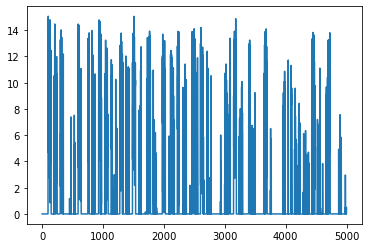

In [99]:
grid = Grid()

log_grid_cells = []
log_grid_cells2 = []
log_grid_cells3 = []
angle = math.radians(20)
angle3 = math.radians(40)
# head direction cell
cells_angle = np.linspace(-np.pi, np.pi, 40)
print(cells_angle)
head_direc_cells = []
for i in range(1,Txx.size):
    rot_mat= np.array([[math.cos(angle),-math.sin(angle)],[math.sin(angle),math.cos(angle)]])
    rot_mat3= np.array([[math.cos(angle3),-math.sin(angle3)],[math.sin(angle3),math.cos(angle3)]])
    speedVector = (Txx[i]-Txx[i-1])+1j*(Tyy[i]-Tyy[i-1])
    txy = np.dot(np.array([Txx[i]-Txx[i-1],Tyy[i]-Tyy[i-1]]),rot_mat)
    txy3 = np.dot(np.array([Txx[i]-Txx[i-1],Tyy[i]-Tyy[i-1]]),rot_mat3)
    speedVector2 = (txy[0])+1j*(txy[1])
    speedVector3 = (txy3[0])+1j*(txy3[1])
    grid.update(speedVector)
    #grid.update2(speedVector2)
    #grid.update3(speedVector3)
    log_grid_cells.append(grid.grid_activity.flatten())
    #head_cell_activity = 10*math.sqrt((Txx[i]-Txx[i-1])**2+(Tyy[i]-Tyy[i-1])**2) * np.cos(cells_angle - (math.atan2(Tyy[i]-Tyy[i-1], Txx[i]-Txx[i-1])))
    ang_diff = math.atan2(Tyy[i]-Tyy[i-1], Txx[i]-Txx[i-1]) - cells_angle
    ang_diff = np.where((ang_diff < -np.pi), 2*np.pi + ang_diff, ang_diff)
    ang_diff = np.where((ang_diff > np.pi), -2*np.pi + ang_diff, ang_diff)
    ang_diff = np.where((ang_diff < np.pi/4) & (ang_diff > -np.pi/4), ang_diff, np.pi/4)
    head_cell_activity = 10*math.sqrt((Txx[i]-Txx[i-1])**2+(Tyy[i]-Tyy[i-1])**2) * np.cos(2*ang_diff)
    head_direc_cells.append(head_cell_activity)
    #log_grid_cells2.append(grid.grid_activity2.flatten())
    #log_grid_cells3.append(grid.grid_activity3.flatten())
    
log_grid_cells = np.array(log_grid_cells)
log_grid_cells2 = np.array(log_grid_cells2)
log_grid_cells3 = np.array(log_grid_cells3)
head_direc_cells = np.array(head_direc_cells)
print(head_direc_cells.shape)
plt.figure()
plt.plot(head_direc_cells[:,1])

# Plot

(5000, 900)
(5000,)


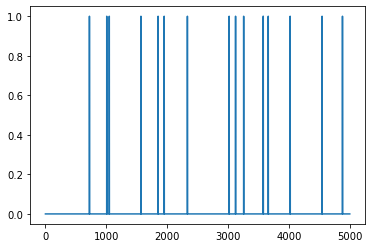

In [5]:
xx = np.copy(Txx[1:])
yy = np.copy(Tyy[1:])
dv_levels = 40
print(log_grid_cells.shape)
print(xx.shape)
twistor_linex = np.where((xx<31) & (xx>30), 1, 0)
twistor_liney = np.where((yy<35) & (yy>24), 1, 0)
twistor_line = twistor_linex*twistor_liney
plt.figure()
plt.plot(twistor_line)

### Spikes in arena

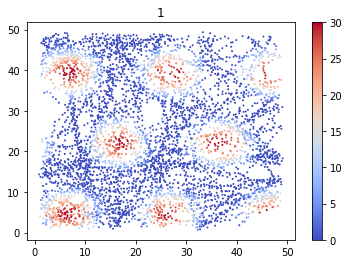

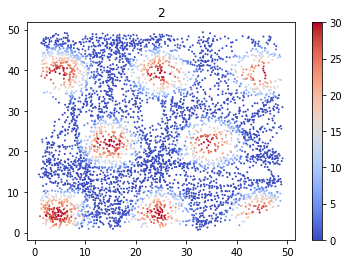

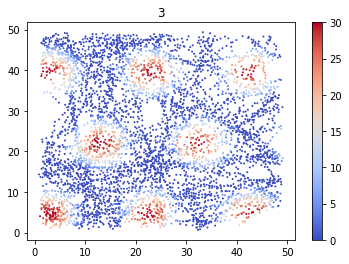

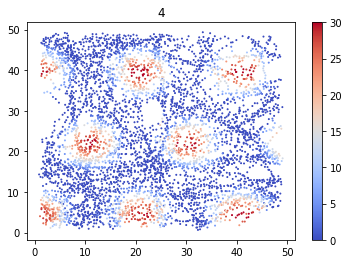

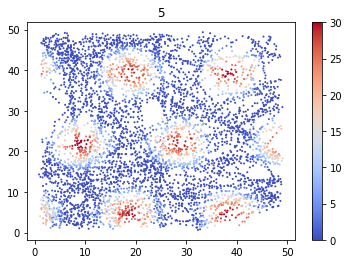

...

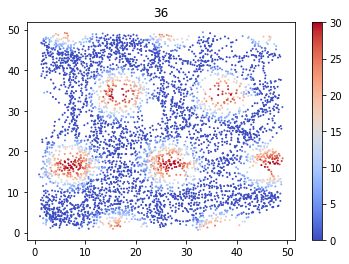

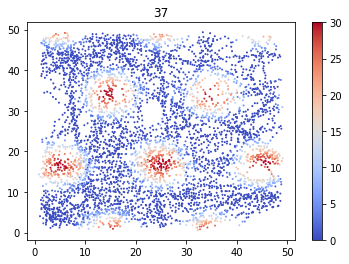

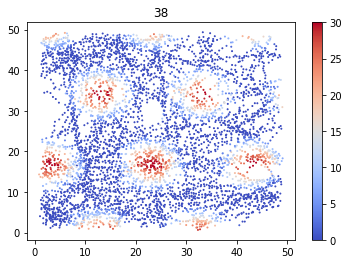

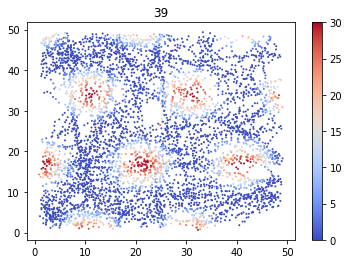

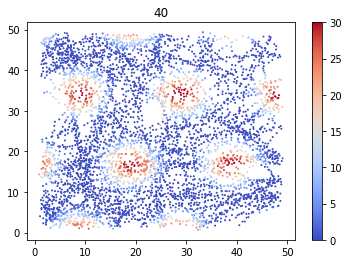

In [77]:
#plt.figure(figsize=(18,2.5))

spiketrain = np.zeros((Time,dv_levels))
spiketrain2 = np.zeros((Time,dv_levels))
for cell_num in range(dv_levels):
    celula = log_grid_cells[:,cell_num]
    #if cell_num %2==0:
        #celula = log_grid_cells[:,cell_num]
    #else:
        #celula = log_grid_cells2[:,cell_num]
    #celula2 = log_grid_cells2[:,cell_num]
    #celula3 = log_grid_cells3[:,cell_num]
    spiketrain[:,cell_num] = celula
    #spiketrain2[:,cell_num] = celula2
    pos_spike_idx = np.where( celula > celula.max()*.9 )[0]
    #plt.figure()
    #plt.subplot(1,dv_levels,cell_num+1)
    #plt.plot(xx,yy)
    #plt.plot(xx[pos_spike_idx] , yy[pos_spike_idx], 'or' )
    fig, ax = plt.subplots()
    mappable = ax.scatter(xx, yy, c=celula ,cmap='coolwarm',vmax=30,s=1)
    fig.colorbar(mappable)
    plt.title(cell_num+1)
    plt.show()

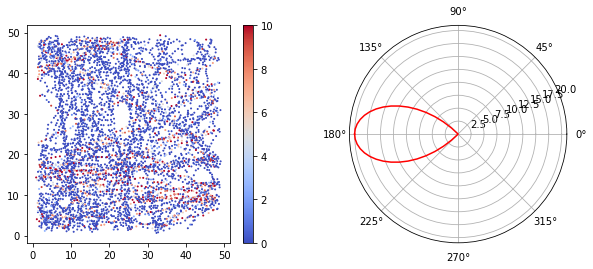

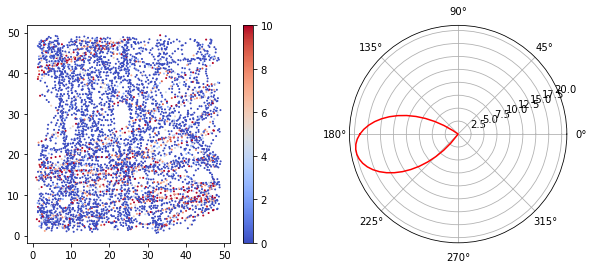

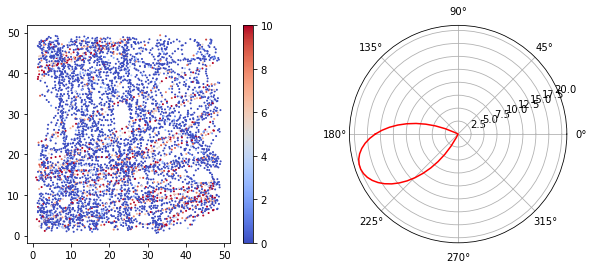

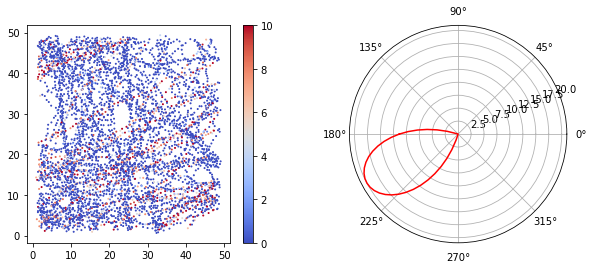

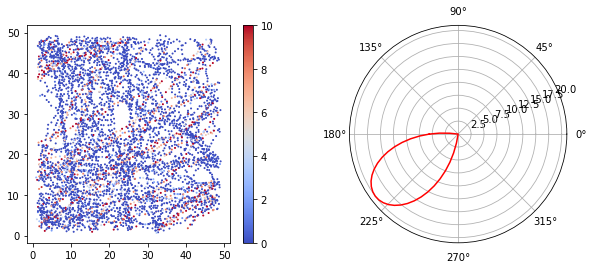

...

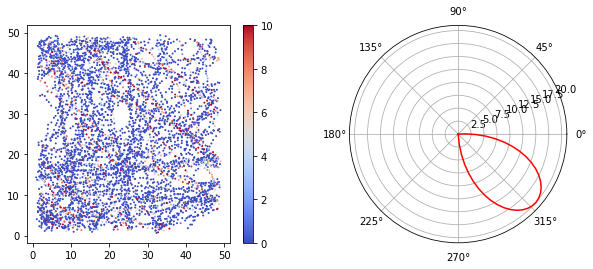

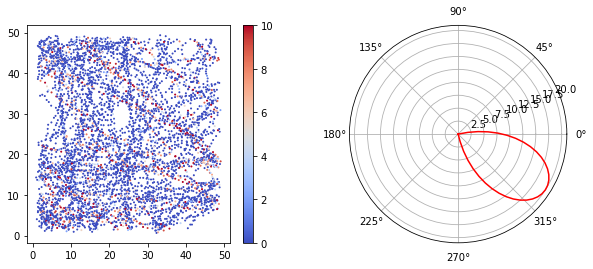

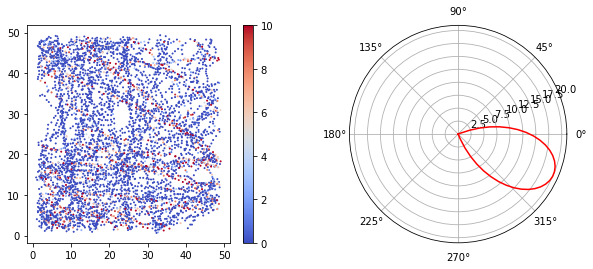

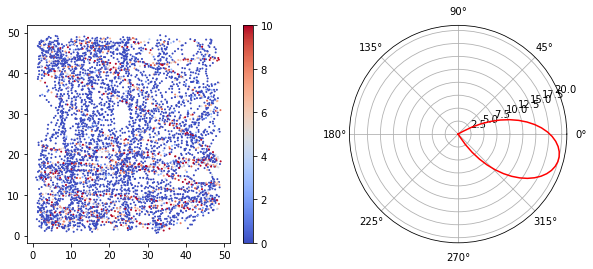

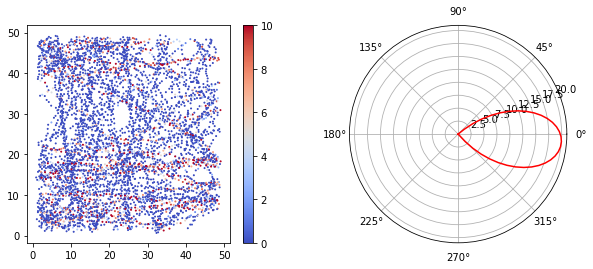

In [100]:
T = np.linspace(-np.pi , np.pi, 128)
for cell_num in range(20):
    angle_hz = np.zeros(1024)
    fig = plt.figure(figsize=(10,4))
    celula = head_direc_cells[:,cell_num]
    ax1 = fig.add_subplot(1, 2, 1)
    mappable = ax1.scatter(xx, yy, c=celula ,cmap='coolwarm',vmax=10,s=1)
    fig.colorbar(mappable)
    #plt.title(cell_num+1)
    ax2 = fig.add_subplot(1, 2, 2,polar = True)
    ang_diff = T - cells_angle[cell_num]
    ang_diff = np.where((ang_diff < -np.pi), 2*np.pi + ang_diff, ang_diff)
    ang_diff = np.where((ang_diff > np.pi), -2*np.pi + ang_diff, ang_diff)
    ang_diff = np.where((ang_diff < np.pi/4) & (ang_diff > -np.pi/4), ang_diff, np.pi/4)
    ax2.plot(T, 20*np.cos(2*ang_diff),color="r")
    plt.show()

In [7]:
#np.savetxt("spiketrain.csv",log_grid_cells[:,:300].T, delimiter=",")

In [11]:
import tensorflow as tf
import numpy as np

import pandas as pd
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap

# PCA or TSNE or UMAP
dim_reduction_way = "UMAP"
#2D or 3D
plot_way = "3D"
neuron_num = 1200
#log_grid_cellsall = np.concatenate([log_grid_cells, log_grid_cells2, log_grid_cells3],axis=1)
x_train = log_grid_cells[:,:neuron_num]#np.loadtxt("activity_grid.csv",       # 読み込みたいファイルのパス
                  #delimiter=",",    # ファイルの区切り文字
                  #skiprows=0,       # 先頭の何行を無視するか（指定した行数までは読み込まない）
                  #usecols=(0,1,2,3) # 読み込みたい列番号
                 #

print(x_train.shape)
x_train_transformed=PCA(n_components=6).fit_transform(x_train.T)
print(x_train_transformed.shape)
#x_train_transformed_2d = x_train_transformed
#x_train_transformed_3d = x_train_transformed
#print(x_train_transformed.shape)
if dim_reduction_way == "PCA":
    x_train_transformed=PCA(n_components=6).fit_transform(x_train)
    x_train_transformed_2d = x_train_transformed
    x_train_transformed_3d = x_train_transformed
elif dim_reduction_way == "TSNE":
    x_train_transformed_2d = TSNE(n_components=2).fit_transform(x_train)
    x_train_transformed_3d = TSNE(n_components=3).fit_transform(x_train)
elif dim_reduction_way == "UMAP":
    x_train_transformed_2d = umap.UMAP(n_neighbors=5, n_components=2).fit_transform(x_train)
    x_train_transformed_3d = umap.UMAP(n_neighbors=150, n_components=3,min_dist=0.3,init="spectral").fit_transform(x_train_transformed)

if plot_way == "2D":
    plt.scatter(x_train_transformed_2d[:,0],x_train_transformed_2d[:,1],s=10, marker="o")
    plt.colorbar()
elif plot_way == "3D":
    #df_train=pd.DataFrame(x_train_transformed_3d[:, 0:3],columns=list("XYZ"))
    fig = px.scatter_3d(x=x_train_transformed_3d[:, 0],y=x_train_transformed_3d[:, 1],z=x_train_transformed_3d[:, 2], size_max=1,
                        opacity=0.2)
    fig.show()

(5000, 900)
(900, 6)


In [103]:
# PCA or TSNE or UMAP
dim_reduction_way = "UMAP"
#2D or 3D
plot_way = "3D"
neuron_num = 1200
#log_grid_cellsall = np.concatenate([log_grid_cells, log_grid_cells2, log_grid_cells3],axis=1)
x_train = head_direc_cells[:,:neuron_num].T

print(x_train.shape)
x_train_transformed=PCA(n_components=6).fit_transform(x_train.T)
print(x_train_transformed.shape)
#x_train_transformed_2d = x_train_transformed
#x_train_transformed_3d = x_train_transformed
#print(x_train_transformed.shape)
if dim_reduction_way == "PCA":
    x_train_transformed=PCA(n_components=6).fit_transform(x_train)
    x_train_transformed_2d = x_train_transformed
    x_train_transformed_3d = x_train_transformed
elif dim_reduction_way == "TSNE":
    x_train_transformed_2d = TSNE(n_components=2).fit_transform(x_train)
    x_train_transformed_3d = TSNE(n_components=3).fit_transform(x_train)
elif dim_reduction_way == "UMAP":
    x_train_transformed_2d = umap.UMAP(n_neighbors=5, n_components=2).fit_transform(x_train)
    x_train_transformed_3d = umap.UMAP(n_neighbors=15, n_components=3,min_dist=0.3,init="spectral").fit_transform(x_train_transformed)

if plot_way == "2D":
    plt.scatter(x_train_transformed_2d[:,0],x_train_transformed_2d[:,1],s=10, marker="o")
    plt.colorbar()
elif plot_way == "3D":
    #df_train=pd.DataFrame(x_train_transformed_3d[:, 0:3],columns=list("XYZ"))
    fig = px.scatter_3d(x=x_train_transformed_3d[:, 0],y=x_train_transformed_3d[:, 1],z=x_train_transformed_3d[:, 2], size_max=1,
                        opacity=0.2)
    fig.show()

(40, 5000)
(5000, 6)


ValueError: 'c' argument has 5000 elements, which is inconsistent with 'x' and 'y' with size 900.

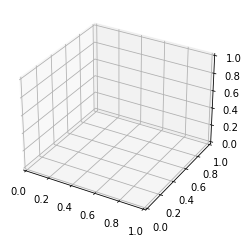

In [9]:
from mpl_toolkits.mplot3d import axes3d    
#%matplotlib notebook

for i in range(neuron_num):
    fig = plt.figure()
    ax = fig.gca(projection='3d')  
    scatter = ax.scatter3D(x_train_transformed_3d[:, 0], x_train_transformed_3d[:, 1], x_train_transformed_3d[:, 2],
                           s=5, c=log_grid_cells[:,i+20:i+21], cmap=plt.cm.viridis)    
    plt.colorbar(scatter)
    plt.title(i+1)
    plt.show()

In [ ]:
fig = plt.figure(figsize=(10,10))
ax = fig.gca(projection='3d')  
scatter = ax.scatter3D(x_train_transformed_3d[:, 0], x_train_transformed_3d[:, 1], x_train_transformed_3d[:, 2],
                       s=20, c=twistor_line, cmap=plt.cm.viridis)    
plt.colorbar(scatter)                        
plt.show()

## Ratemaps

In [ ]:
SIGMA2 = 15
maxxx = [ np.max(xx) , np.max(yy)  ]
arena_width = max(maxxx)+2
xxA,yyA = np.meshgrid(np.arange(0,arena_width,2),np.arange(0,arena_width,2))
xxA = np.ravel(xxA)
yyA = np.ravel(yyA)

#plt.figure(figsize=(18,4.5))


for cell_num in range(dv_levels):

    ###### Bined arena
    celula = log_grid_cells[:,cell_num]

    arenaOpp = np.zeros(xxA.size)
    arena = np.zeros(xxA.size)
    for ii in range(len(xxA)):
        arenaOpp[ii] = np.sum(np.exp(-np.abs((xxA[ii]+1j*yyA[ii])-(xx+1j*yy))**2/SIGMA2))
        arena[ii] = np.sum(np.exp(-np.abs((xxA[ii]+1j*yyA[ii])-(xx+1j*yy))**2/SIGMA2)* celula )/arenaOpp[ii]
    arena = arena.reshape(len(np.arange(0,arena_width,2)),len(np.arange(0,arena_width,2)))

    autocorrel = signal.correlate2d(arena,arena)


    #plt.subplot(2,dv_levels,cell_num+1)
    plt.figure()
    plt.imshow(  arena, aspect='auto', cmap='Blues' )

    #plt.subplot(2,dv_levels,cell_num+1+dv_levels)
    #plt.imshow(  autocorrel, aspect='auto', cmap='Blues' )


plt.show()